# Кластеризация и визуализация каталога Spotify (200 000 треков) с целью получения алгоритма для построения плейлистов

### Цели:
### 1. Понять структуру акустического пространства

- Разведочный анализ распределений и корреляций аудио‑признаков.

- Проверить взаимосвзяь категорий

### 2. Построить непрерывную 2‑D проекцию треков

- Использовать UMAP для нелинейного снижения размерности.

- Визуализировать плотности и «острова» жанров/настроений.

### 3. Сгруппировать треки методом HDBSCAN

- Получить кластеры.

- Оценить качество кластеризации (silhouette, визуальный осмотр).

### 4. Интерпретировать и проверить практическую полезность
- Реализовать готовую утилиту для подборки треков по входным данным (5 треков)

### О данных

В данном датасете представлен набор треков с их характеристиками:
- Исполнитель
- Название трека
- Мера изменчивости звуковых характеристик песни
- Жанр
- Год выпуска
- Тональность 
- Темп (в Уд\мин)
- Средняя громкость песни
- Наличие ненормативной лексики

Также в данном датасете присутствуют признаки, полученные с помощью нейросети T5 от компании Google. Вот эти признаки:

- Основная эмоция песни
- Насколько вероятно трек является танцевальным (0-100)
- Энергичность трека
- Позитивность
- Речетативность 
- Вероятность записи трека быть живым выступлением
- Акустическое качество
- Вероятность того, что трек инструментальный

Зачастую, простых данных о треке таких как жанр и исполнитель не хватает для качественной подборки плейлистов.

Именно поэтому текущий датасет предоставляет нам возможность спроектировать алгоритм для подборки плейлистов, основанных на небольшой выборке любимых треков пользователя.

### Начнём с разведочного анализа данных

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
import umap
import hdbscan
from sklearn import metrics
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

In [317]:
sns.set(style='whitegrid', rc={'figure.figsize':(10,7)})

In [318]:
DATA_PATH = 'datasets/light_spotify_dataset.csv'
df = pd.read_csv(DATA_PATH)

In [319]:
df.drop_duplicates()
df.isnull().sum()

artist              0
song                8
emotion             0
variance            0
Genre               0
Release Date        0
Key                 0
Tempo               0
Loudness            0
Explicit            0
Popularity          0
Energy              0
Danceability        0
Positiveness        0
Speechiness         0
Liveness            0
Acousticness        0
Instrumentalness    0
dtype: int64

Как мы видим, в нашем датасете, к счастью, отсутсвуют NAN-ы. Рассмотрим распределение эмоций по песням:

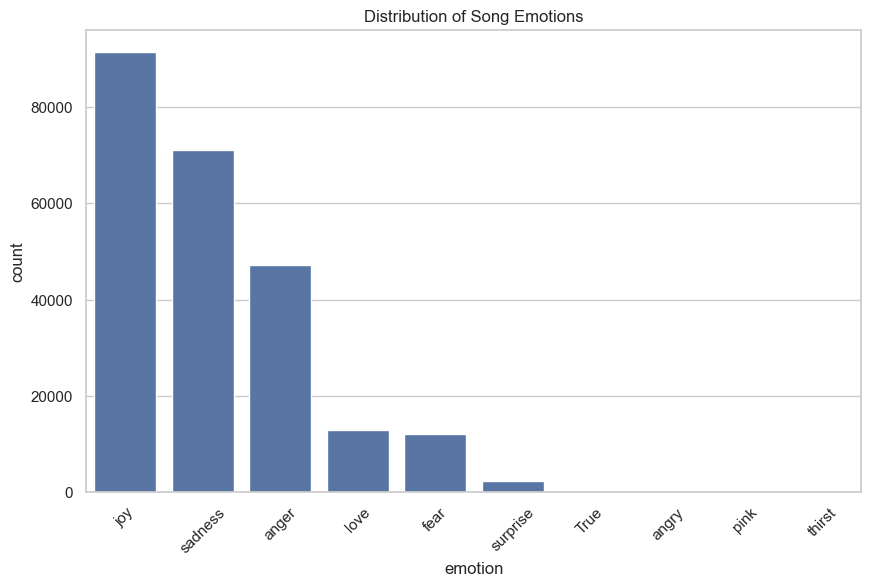

In [320]:
plt.figure(figsize=(10,6))
sns.countplot(data=df,x='emotion',order=df['emotion'].value_counts().index)
plt.title('Distribution of Song Emotions')
plt.xticks(rotation=45)
plt.show()

Как мы видим, присутсвуют очень малые категории + нужно совместить категорию anger и angry.
Уберем малые категории (pink, True, thirst)

In [321]:
df['emotion'] = df['emotion'].replace('angry', 'anger')
df = df[~df['emotion'].isin(['pink', 'thirst', 'True'])]

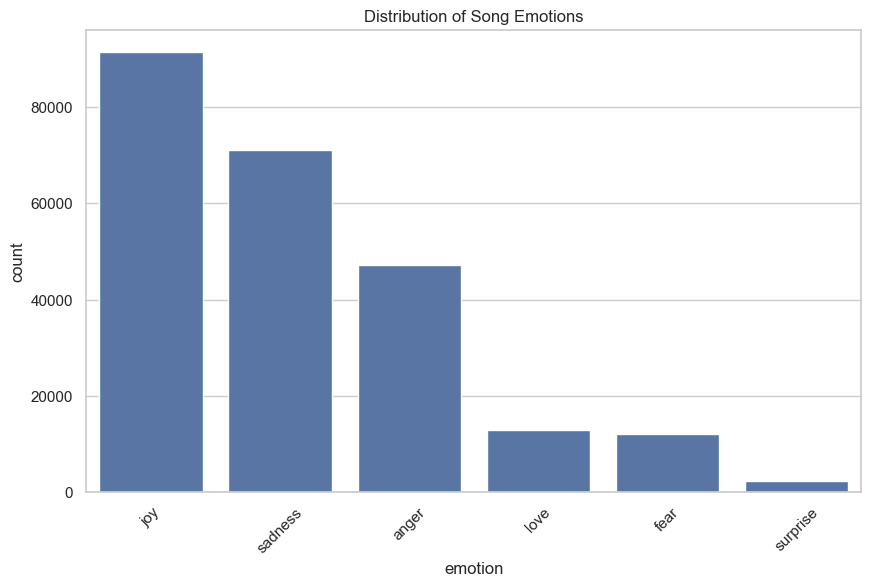

In [322]:
plt.figure(figsize=(10,6))
sns.countplot(data=df,x='emotion',order=df['emotion'].value_counts().index)
plt.title('Distribution of Song Emotions')
plt.xticks(rotation=45)
plt.show()

Рассмотрим распределние по жанрам:

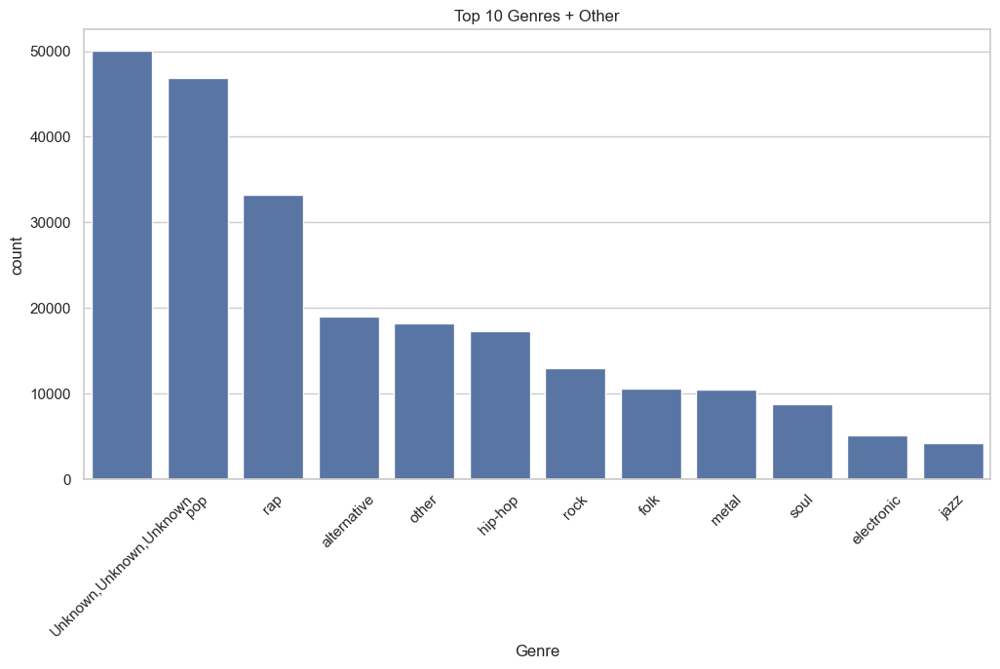

In [323]:
top_genres = df['Genre'].value_counts().nlargest(11).index
df['Genre']=df['Genre'].apply(lambda x: x if x in top_genres else 'other')

plt.figure(figsize=(12,6))
sns.countplot(data=df, x='Genre', order=df['Genre'].value_counts().index)
plt.title('Top 10 Genres + Other')
plt.xticks(rotation=45)
plt.show()

Переименуем Unkown, Unkown, Unkown в Other для удобства + рассмотрим распределние популярности по песням

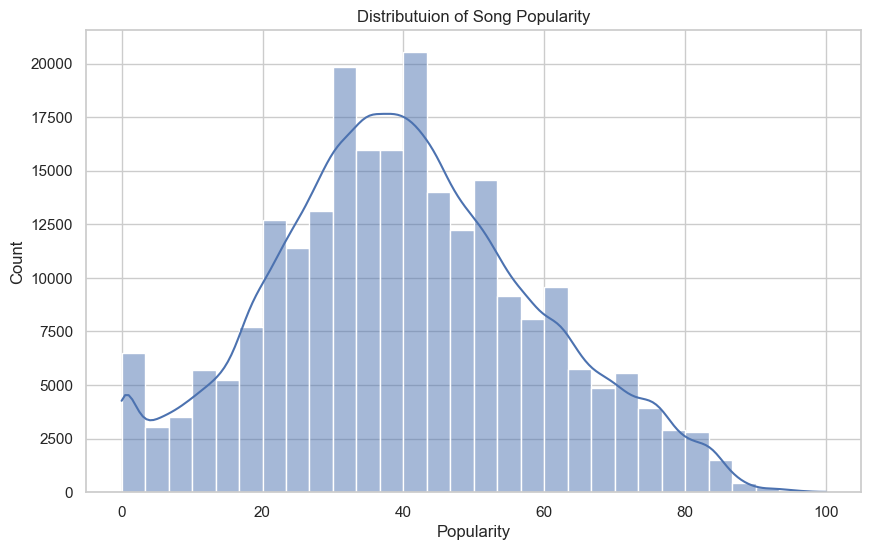

In [324]:
df['Genre']=df['Genre'].replace('Unknown,Unknown,Unknown','other')
plt.figure(figsize=(10,6))
sns.histplot(df['Popularity'],bins=30, kde=True)
plt.title('Distributuion of Song Popularity')
plt.show()

Построим Heat-мап'у по всем числовым признакам и посмотрим на корреляции

<Axes: >

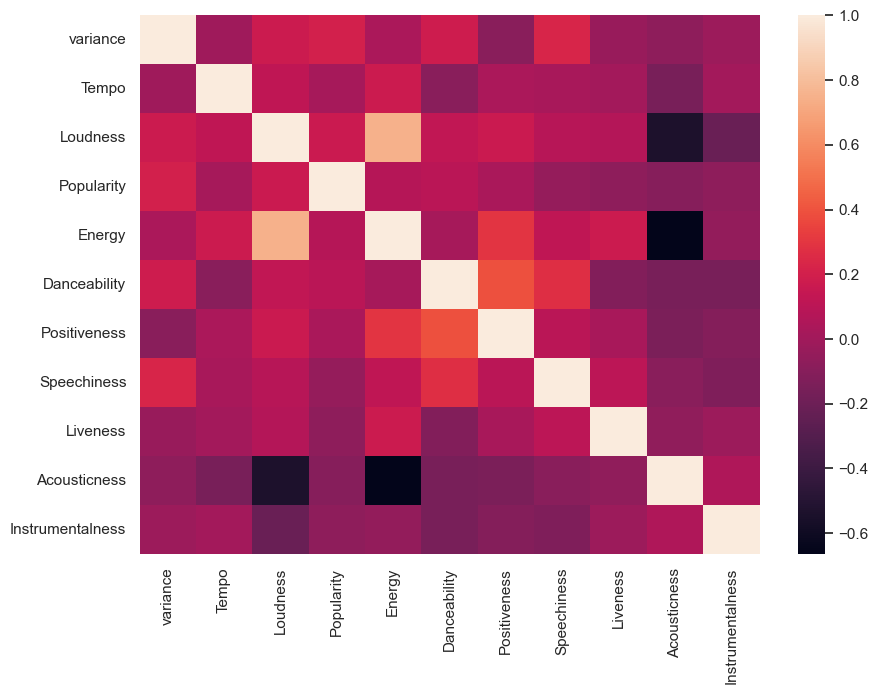

In [325]:
numeric_df = df.select_dtypes(include=['number'])
numeric_df.drop(columns='Release Date', inplace=True)
corr_matrix = numeric_df.corr()
sns.heatmap(corr_matrix)

Мы можем увидить 2 достаточно интересных факта:
- 1. Энергичность трека высоко коррелирует с громкостью трека
- 2. Акустичность сильно анти-коррелирует с энергией и громкостью

Таким образом в дальнейшем пре-процессинге мы можем отбросить среднюю громкость и акустичность

Теперь сравним распределения в завимости от наличия нецензурной лексики в треках

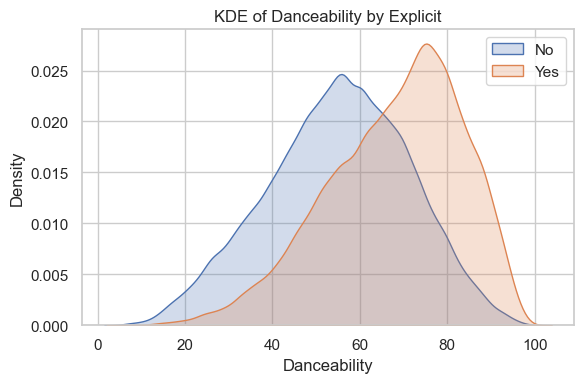

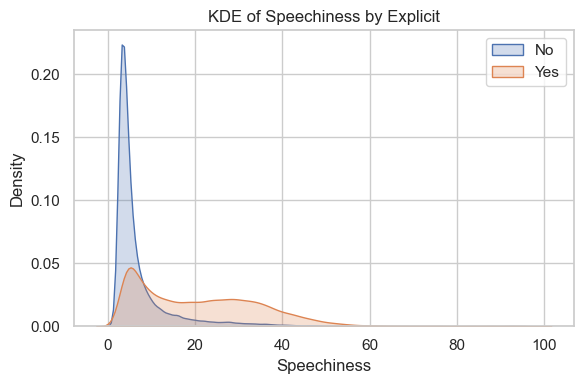

In [326]:
numeric_df['Explicit'] = df['Explicit']

cols_to_plot = ['Danceability', 'Speechiness']

for col in cols_to_plot:
    plt.figure(figsize=(6, 4))
    sns.kdeplot(data=numeric_df[numeric_df['Explicit'] == 'No'], x=col, label='No', fill=True)
    sns.kdeplot(data=numeric_df[numeric_df['Explicit'] == 'Yes'], x=col, label='Yes', fill=True)
    plt.title(f'KDE of {col} by Explicit')
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.legend()
    plt.tight_layout()
    plt.grid(True)
    plt.show()

Как мы можем наблюдать
- Песни с ненормативной лексикой намного чаще имеют более высокий показатель речетативности и танцевальности. 

Таким образом мы завершаем разведывательный анализ данных и переходим к обработке данных перед кластеризацией.

Но сначала пару слов об алгоритмах UMAP

UMAP (Uniform Manifold Approximation and Projection) был создан Лилендом Макиннесом совместно с его коллегами из Таттского института в 2018г. Целью было получить алгоритм, похожий на t-SNE, но с более сильным математическим обоснованием.

Суть работы UMAP

# UMAP: Uniform Manifold Approximation & Projection

## 1. Идея
1. **Локальные соседи.** Для каждой точки $x_i$ ищем $k$ ближайших соседей $\mathcal N_k(i)$ по метрике $d(\cdot,\cdot)$ (например *euclidean*).

2. **Граф в $\mathbb R^{D}$.** Из расстояний делаем вероятности соседства  

   $$
   p_{ij}= \exp\!\Bigl(-\tfrac{\max(0,\,d_{ij}-\rho_i)}{\sigma_i}\Bigr), 
   \quad j\in\mathcal N_k(i).
   $$

   Параметры $\rho_i$ (минимальный радиус) и $\sigma_i$ подбираются так, чтобы  

   $$
   \sum_{j} p_{ij} = \log_2 k,
   $$

   — тем самым у всех точек одинаковая «энтропия» окружения.  

   Симметризация (t‑норма Лукаса) даёт  

   $$
   w_{ij}=p_{ij}+p_{ji}-p_{ij}p_{ji}\in[0,1].
   $$

3. **Проекция в $\mathbb R^{d}$ и оптимизация.** В низком измерении задаём  

   $$
   q_{ij}= \frac{1}{1+a\lVert y_i - y_j \rVert^{2b}}
   \quad (a,\,b \text{ — константы из } \texttt{min\_dist}),
   $$

   и минимизируем бинарную кросс‑энтропию  

   $$
   \mathcal L =
   -\sum_{i<j}\bigl[
     w_{ij}\log q_{ij}
     +(1-w_{ij})\log(1-q_{ij})
   \bigr].
   $$

   Оптимизация — стохастический градиентный спуск с отрицательной выборкой (*negative sampling*).

---

## 2. Ключевые гиперпараметры

| Параметр        | Значение / смысл                                                    |
|-----------------|---------------------------------------------------------------------|
| `n_neighbors`   | $k$ — баланс локальная ←→ глобальная структура                      |
| `min_dist`      | минимальная дистанция в проекции: ↓ → кластеры плотнее              |
| `metric`        | метрика в $\mathbb R^{D}$ (*euclidean*, *cosine*, …)                |

---

## 3. Почему UMAP подходит для музыкальных данных

- Сохраняет форму **локальных** кластеров (жанры/муды) и относительное расположение «островов» — t‑SNE этим жертвует.  
- Линейная сложность по памяти при $k \ll N$ → обрабатывает *200 k треков* на ноутбуке.  
- Параметр `min_dist` позволяет «сжимать» плотные зоны, подчёркивая жанровые и эмоциональные кластеры.

---


При нашей идее подбора нам не важны такие признаки как:
- популярность песни
- дата её выхода
- Название песни и Псевдоним артиста
- Тональность

Также выкинем признаки, у которых высокая корреляция (Acousticness, Energy)

In [327]:
# Убираем ненужные данные
df_cleaned = df.drop(columns=['artist', 'Release Date', 'song', 'Key', 'Popularity', 'Acousticness', 'Energy']).copy()

# Кодируем категориальные признаки.
label_encoder = LabelEncoder()
for col in ['Genre', 'emotion', 'Explicit']:
    df_cleaned[col] = label_encoder.fit_transform(df_cleaned[col])

# Применяем StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(df_cleaned)

In [342]:
reducer = umap.UMAP(
    n_neighbors=15,
    min_dist=0.05,
    metric='euclidean',
    n_components=2,
    low_memory=False
)
embedding = reducer.fit_transform(X)

In [343]:
clusterer = hdbscan.HDBSCAN(
    max_cluster_size=len(df_cleaned) // 4,
    min_cluster_size=100,
    metric='euclidean',
)
cluster_labels = clusterer.fit_predict(embedding)

n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)
print(f"Найдено {n_clusters} кластеров (+ шум)")

Найдено 38 кластеров (+ шум)


Как метрику "успеха будет использовать Silhouette Score"

# Silhouette Score: что измеряет и как считать

## 1. Формула для одной точки $x_i$

$$
a(i)=\frac{1}{|C_i|-1}\sum_{x_j\in C_i,\;j\neq i} d(x_i,x_j)
\quad\text{(средняя дистанция до своего кластера)}
$$

$$
b(i)=\min_{C\neq C_i}\;
        \frac{1}{|C|}\sum_{x_j\in C} d(x_i,x_j)
\quad\text{(лучшая чужая «соседняя» кластер‑дистанция)}
$$

$$
s(i)=\frac{\,b(i)-a(i)\,}{\max\{a(i),\,b(i)\}}
\in[-1,\,1]
$$

- $s(i)\approx 1$ — точка далеко от чужих, близко к своим (**отлично**).  
- $s(i)\approx 0$ — граница между кластерами.  
- $s(i)<0$        — точка ближе к чужому кластеру, чем к своему (**плохое назначение**).

---

## 2. Глобальный показатель

$$
\mathrm{Silhouette}(X,\mathcal C)=\frac{1}{N}\sum_{i=1}^{N} s(i)
$$

Считается по всем $N$ точкам или только по не‑noise точкам, если алгоритм (HDBSCAN) выбрасывает шум.

---

## 3. Грубая шкала интерпретации

| Среднее $s$      | Толкование                                                          |
|------------------|---------------------------------------------------------------------|
| $s<0$            | кластеры перекрываются — пере‑ или недокластизация                  |
| $0\;…\;0.20$     | слабое разделение, «пятна» без чётких границ                        |
| $0.20…0.50$      | умеренное качество (норма для реальных данных)                      |
| $>0.50$          | высокое качество, редко встречается вне синтетических данных        |

---

In [349]:
mask = cluster_labels != -1
if mask.sum() > 1 and len(np.unique(cluster_labels[mask])) > 1: # Долго считается достаточно, поэтому возьмём подмн-во
    sil = metrics.silhouette_score(embedding[mask][::5], cluster_labels[mask][::5])
    print(f"Silhouette score (w/o noise) = {sil:.3f}")
else:
    print('Not enough clustered samples for silhouette.')

Silhouette score (w/o noise) = 0.349


In [344]:
df_plot = pd.DataFrame({
    'UMAP-1': embedding[:, 0],
    'UMAP-2': embedding[:, 1],
    'cluster': cluster_labels
})

df_plot['Cluster'] = df_plot['cluster'].apply(lambda x: 'noise' if x == -1 else f'cluster {x}')

fig = px.scatter(
    df_plot,
    x='UMAP-1',
    y='UMAP-2',
    color='Cluster',
    title='UMAP projection with HDBSCAN clusters',
    opacity=0.6,
)

fig.update_traces(marker=dict(size=4))
fig.update_layout(
    width=800,
    height=600,
    legend_title='Cluster',
    xaxis_title='UMAP‑1',
    yaxis_title='UMAP‑2'
)

fig.show()

Скриншот результата:
![alt text](newplot.png "Результат")


### Теперь перейдём к примеру использования, который может быть полезен в реальном мире - подбор похожего трека к текущему

In [350]:
def nearest_in_cluster(df: pd.DataFrame,
                       query_tracks: list[str],
                       n_neighbors: int = 10) -> dict[str, pd.DataFrame]:
    results = {}

    for q in query_tracks:
        artist, song = q[0], q[1]
        mask_q = (df['song'].str.lower() == str(song).lower()) & (df['artist'].str.lower() == str(artist).lower())
        if not mask_q.any():
            print(f"⚠️  «{q[0]} - {q[1]}» не найден(а) в датафрейме.")
            continue

        row = df.loc[mask_q].iloc[0]
        c_label = row['cluster']
        if c_label == -1:
            print(f"ℹ️  «{q[0]} - {q[1]}» помечен(а) как шум (-1); похожие искать не будем.")
            continue

        cand = df[(df['cluster'] == c_label) & (~mask_q)].copy()
        if cand.empty:
            print(f"ℹ️  Кластер {c_label} содержит только «{q[0]} - {q[1]}».")
            continue

        q_vec = row[['UMAP-1', 'UMAP-2']].to_numpy(dtype=np.float32).reshape(1, -1)
        cand_vec = cand[['UMAP-1', 'UMAP-2']].to_numpy()
        dists = np.linalg.norm(cand_vec - q_vec, axis=1)

        cand['distance'] = dists
        nearest = (cand
                    .sort_values('distance')
                    .head(n_neighbors)
                    [['artist', 'song', 'distance']])
        results[f"{artist} - {song}"] = nearest.reset_index(drop=True)

    return results

# ---------------- пример использования ----------------
my_five_songs = [
    ["Nirvana", "You know you're right"],
    ["Red Hot Chili Peppers", "Californication"],
    ["Queen", "Bohemian Rhapsody"],
    ["Snoop Dogg", "Drop It Like Its Hot"],
    ["Clash", "Should I Stay Or Should I Go"]
]

df_final = df_cleaned.copy()

df_final = pd.concat([df_final, df_plot], axis=1)

df_final['song'] = df['song']
df_final['artist'] = df['artist']
df_final['popularity'] = df['Popularity']

recommendations = nearest_in_cluster(df_final, my_five_songs)

for origin, rec_df in recommendations.items():
    print(f"\n🎵 Похожие на «{origin}»:\n")
    display(rec_df)



🎵 Похожие на «Nirvana - You know you're right»:



,artist,song,distance
0,Nick Cave,Rock Of Gibraltar,0.006136
1,Unwritten Law,Coffin Text,0.009257
2,Offspring,Smash It Up,0.010887
3,Nick Cave,I Let Love In,0.011680
4,Nickelback,Falls Back On,0.017715
5,Used,The Bird And The Worm,0.018323
6,Pearl Jam,I Got Id,0.018956
7,Nirvana,Scentless Apprentice,0.020535
8,The Killers,Show You How,0.023303
9,NOFX,Green Corn,0.026115



🎵 Похожие на «Red Hot Chili Peppers - Californication»:



,artist,song,distance
0,Alice In Chains,Died,0.002276
1,Fiona Apple,Oh Well,0.004021
2,Whiskeytown,Somebody Remembers The Rose,0.009345
3,Face To Face,Big Choice,0.014908
4,Evanescence,Made Of Stone,0.015672
5,Dave Matthews Band,JTR (John The Revalator),0.016230
6,O.A.R.,Sunday Bloody Sunday,0.018344
7,OneRepublic,Feel Again,0.020557
8,Weezer,Perfect Situation,0.021634
9,Patti Smith,The Boy In The Bubble,0.024977



🎵 Похожие на «Queen - Bohemian Rhapsody»:



,artist,song,distance
0,U2,The Hands That Built America,0.009813
1,Toto,Only You,0.013422
2,Doobie Brothers,Evil Woman,0.015962
3,Tina Turner,I Can't Stop Loving You,0.018537
4,Alice Cooper,Pass The Gun Around,0.021351
5,Otis Redding,A Change Is Gonna Come,0.022536
6,Rod Stewart,Ole Ola,0.025108
7,Aerosmith,Dime Store Lover,0.026510
8,Aerosmith,Falling In Love (Is Hard On Your Knees),0.032202
9,Nazareth,Juilet,0.034611



🎵 Похожие на «Snoop Dogg - Drop It Like Its Hot»:



,artist,song,distance
0,Young Thug,F Cancer Boosie,0.006809
1,Bear Hands,Agora,0.021087
2,Lil Keed,Pull Up,0.024730
3,Lloyd,My Bestie,0.026314
4,Chris Brown,Problem with You,0.026620
5,Sam Lachow,80 Bars Part 2,0.039173
6,Todrick Hall,Type,0.041929
7,Ducktails,Killin the Vibe,0.042639
8,YG,Stop Snitchin Remix,0.043365
9,"Lil Nas X, Billy Ray Cyrus & Diplo",Old Town Road Diplo Remix,0.043938



🎵 Похожие на «Clash - Should I Stay Or Should I Go»:



,artist,song,distance
0,Queensryche,Reach,0.018379
1,Hank Williams Jr.,Stirrin' It Up,0.018768
2,George Strait,Don't Make Me Come Over There And Love You,0.019827
3,Amy Grant,Hats,0.020552
4,Yes,Be The One,0.021225
5,Iron Maiden,The Apparition,0.026198
6,Kelly Clarkson,Dirty Little Secret,0.028552
7,Backstreet Boys,Masquerade,0.028943
8,Leann Rimes,Nothin' New Under The Moon,0.029329
9,Glee,For Once In My Life,0.032218
